<div class="alert alert-info">
Author: GOKUL J<br>
Last Modified: 2022/11/30<br>
Version: V1.0<br>
Email_Id: jgokulakrishnanamudha@gmail.com<br>
</div>

# TOPIC MODELLING
#### Topic modeling is a form of unsupervised learning that identifies hidden relationships in data. 
#### Being unsupervised, topic modeling doesn’t need labeled data. It can be applied directly to a set of text documents to extract information.

#### Topic modeling works in an exploratory manner, looking for the themes (or topics) that lie within a set of text data.

#### It discovers topics using a probabilistic framework to infer the themes within the data based on the words observed in the documents.

#### Topic modeling is a versatile way of making sense of an unstructured collection of text documents.

#### It can be used to automate the process of sifting through large volumes of text data and help to organize and understand it.

#### Once key topics are discovered, text documents can be grouped for further analysis, to identify trends, for instance


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from tqdm.auto import tqdm
import re
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
import wordcloud
##from swifter import swifter
##import uuid


print ("All the required modules are imported successfully")

All the required modules are imported successfully


### If you haven't installed the below module and package, you can install it with
><br>`pip install google_play_scraper`<br>`pip install tqdm`.


## DATA COLLECTION

In [6]:
%%time
df1 = reviews_all('com.google.android.apps.nbu.paisa.user',sleep_milliseconds=0,lang='en', country='us')

CPU times: total: 2.89 s
Wall time: 2.89 s


In [7]:
def googleplaystore_scraper(link,milli,lang_code,country_code):
    """
    Function will scrap the reviews from the google playstore for the provided link and return the dataframe
    
    Arg:
    link - provide the google playstore link eg:com.google.android.apps.nbu.paisa.user
    milli - sleep_milliseconds default to '0'
    lang_code - lang eg: 'en'
    country_code - country eg: 'us' 
    
    Return:
    Dateframe - Dataframe with following features(reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt)
    """
    reviews = reviews_all(link,sleep_milliseconds=milli,lang=lang_code,country=country_code,sort=Sort.NEWEST)
    df1 = pd.DataFrame(np.array(reviews),columns=['review'])
    df1 = reviews_df.join(pd.DataFrame(reviews_df.pop('review').tolist()))
    return df1

In [8]:
df=df1.copy()

In [9]:
df.head()

,Unnamed: 0,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt
0,0,d62052b5-cf74-4bd7-acbd-f2906ee4643a,Bishal Deb Tuhin,https://play-lh.googleusercontent.com/a-/ACNPE...,Good,5,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:58:44,NaN,NaN
1,1,b96cb7e1-f176-4465-b7d0-46ce99ad9240,Sumit Pathak,https://play-lh.googleusercontent.com/a-/ACNPE...,Nice,5,0,NaN,2022-11-24 10:56:46,NaN,NaN
2,2,98e3d388-6333-40e9-885f-92a15c8e9140,navy navy,https://play-lh.googleusercontent.com/a-/ACNPE...,Not fast open,2,0,166.1.5 (armeabi-v7a_release_flutter),2022-11-24 10:56:28,Sorry about that. Please ensure that you're us...,2022-11-24 11:15:35
3,3,6836d505-8b5e-4a31-a641-ae87ad27094e,Shani Pand,https://play-lh.googleusercontent.com/a/ALm5wu...,Ist2jUs,5,0,164.1.2 (arm64-v8a_release_flutter),2022-11-24 10:52:45,NaN,NaN
4,4,8283da75-2962-4009-a075-ca1b6c31e3cb,renuka bagalkot,https://play-lh.googleusercontent.com/a-/ACNPE...,Recently i referred to so many friends but I w...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:50:49,Hi Renuka. We'll surely get you that reward. F...,2022-11-24 11:30:21


In [10]:
df.describe()

,Unnamed: 0,score,thumbsUpCount
count,370140.000000,370140.000000,370140.000000
mean,185069.500000,3.866548,1.138864
std,106850.358656,1.615708,70.416758
min,0.000000,1.000000,0.000000
25%,92534.750000,3.000000,0.000000
50%,185069.500000,5.000000,0.000000
75%,277604.250000,5.000000,0.000000
max,370139.000000,5.000000,22128.000000


In [11]:
df.dtypes

Unnamed: 0               int64
reviewId                object
userName                object
userImage               object
content                 object
score                    int64
thumbsUpCount            int64
reviewCreatedVersion    object
at                      object
replyContent            object
repliedAt               object
dtype: object

In [12]:
df.ndim

2

In [13]:
df.shape

(370140, 11)

In [14]:
df.size

4071540

In [15]:
df.values

array([[0, 'd62052b5-cf74-4bd7-acbd-f2906ee4643a', 'Bishal Deb Tuhin',
        ..., '2022-11-24 10:58:44', nan, nan],
       [1, 'b96cb7e1-f176-4465-b7d0-46ce99ad9240', 'Sumit Pathak', ...,
        '2022-11-24 10:56:46', nan, nan],
       [2, '98e3d388-6333-40e9-885f-92a15c8e9140', 'navy navy', ...,
        '2022-11-24 10:56:28',
        "Sorry about that. Please ensure that you're using the latest version of the app. For more info, check out our Help Center: https://goo.gle/3aQkQu3. For further assistance, reach out to our support team. Here's how: https://goo.gle/2PQQFuc.",
        '2022-11-24 11:15:35'],
       ...,
       [370137, '662342b7-2880-4067-ac40-ce260b81c9fd', 'navjot singh',
        ..., '2021-09-12 16:32:56', nan, nan],
       [370138, '5e326f0d-d633-413a-afee-2295aedb529a',
        'Achal Srivastava', ..., '2021-09-12 16:32:43', nan, nan],
       [370139, '273ddb0b-f198-4e7f-96dc-1608c0389193', 'shankar k', ...,
        '2021-09-12 16:32:42', nan, nan]], dtype=object)

In [16]:
df.duplicated().any()

False

In [17]:
df.isnull().values.any()

True

In [18]:
df.isnull().sum().sum()

692038

In [19]:
df.isnull().sum()

Unnamed: 0                   0
reviewId                     0
userName                     0
userImage                    0
content                      4
score                        0
thumbsUpCount                0
reviewCreatedVersion     46506
at                           0
replyContent            322764
repliedAt               322764
dtype: int64

In [20]:
# Reset index after drop
df=df.dropna().reset_index(drop=True)

In [21]:
# Checking Null values
df.isnull().sum()

Unnamed: 0              0
reviewId                0
userName                0
userImage               0
content                 0
score                   0
thumbsUpCount           0
reviewCreatedVersion    0
at                      0
replyContent            0
repliedAt               0
dtype: int64

## DATA PREPROCESSING

In [22]:
def decontracted(text):
    text = re.sub(r"won\'t", "will not", text)
    text = re.sub(r"can\'t", "can not", text)
    text = re.sub(r"n\'t", "not", text)
    text = re.sub(r"\'t", "not", text)
    text = re.sub(r"\'re", "are", text)
    text = re.sub(r"\'s", "is", text)
    text = re.sub(r"\'d", "would", text)
    text = re.sub(r"\'ll", "will", text)
    text = re.sub(r"\'ve", "have", text)
    text = re.sub(r"\'m", "am", text)
    return text

In [23]:
def data_preprocessing(df):
    tqdm.pandas(desc='Decontracted the text')
    df = df.progress_apply(lambda x: decontracted(str(x)))
    tqdm.pandas(desc='Lowering the text and removing the whitspace')
    df = df.progress_apply(lambda x: x.lower().strip())
    return df

In [24]:
df['content'] = data_preprocessing(df['content'])

Decontracted the text:   0%|          | 0/42084 [00:00<?, ?it/s]

Lowering the text and removing the whitspace:   0%|          | 0/42084 [00:00<?, ?it/s]

In [25]:
df.head()

,Unnamed: 0,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt
0,2,98e3d388-6333-40e9-885f-92a15c8e9140,navy navy,https://play-lh.googleusercontent.com/a-/ACNPE...,not fast open,2,0,166.1.5 (armeabi-v7a_release_flutter),2022-11-24 10:56:28,Sorry about that. Please ensure that you're us...,2022-11-24 11:15:35
1,4,8283da75-2962-4009-a075-ca1b6c31e3cb,renuka bagalkot,https://play-lh.googleusercontent.com/a-/ACNPE...,recently i referred to so many friends but i w...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:50:49,Hi Renuka. We'll surely get you that reward. F...,2022-11-24 11:30:21
2,13,91b27825-8431-448b-bd9d-87b9ed32a0ac,Suraj Patel,https://play-lh.googleusercontent.com/a-/ACNPE...,payment issue,2,0,136.1.5 (arm64-v8a_release_flutter),2022-11-24 10:38:56,"Uh-oh. We're sorry, Suraj. Please check if you...",2022-11-24 10:54:58
3,18,19b11931-d761-4910-b4e1-859db1b0f244,Aswin kumar,https://play-lh.googleusercontent.com/a-/ACNPE...,app opening issue,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:19:55,Hi Aswin. Please ensure that you're using the ...,2022-04-04 22:05:56
4,24,173c9bf1-d591-4251-8846-14a6d22ad83d,Prabin kumar bhoi,https://play-lh.googleusercontent.com/a-/ACNPE...,it is very slow and app is not opening now.ver...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 09:59:01,"Sorry about that, Prabin. Please ensure that y...",2022-11-24 10:14:03


Int64Index([1, 3, 2, 5, 4], dtype='int64')
[30408  5229  4882   944   621]


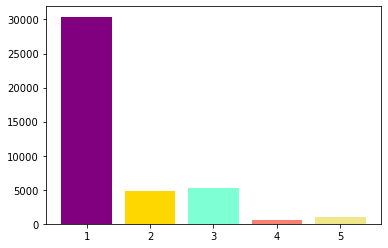

<Figure size 1800x2520 with 0 Axes>

In [26]:
sr = df['score'].value_counts()
print(sr.index) #This will be our bar labels
print(sr.values) #This will be the heights of the bars

plt.bar(x=sr.index, height=sr.values, color =['purple', 'aquamarine', 'gold', 'khaki', 'salmon']);

fig = plt.figure(figsize=(25, 35))

In [27]:
gp_df= df.copy()

> 1 Cleaning data (Process of adding missing data and correcting, repairing,  or irrelevant data from a data set)
>> 2 Removing punctuation (Removes all punctuation from the given Pandas Series and replace it with a single space)
>>> 3 Removing numericals (Removes all int values in the data set)
>>>> 4 Stopward removal (Removing the words that occur commonly across all the documents in the corpus)
>>>>> 5 Tokenization (Process of dividing text into a set of meaningful pieces)
>>>>>> 6 Lemmatization (One of the most common text pre-processing techniques)
>>>>>>> 7 LDA (Unsupervised algorithm that assigns each document a value for each defined topic)

### Cleaning Data

In [28]:

gp_df['clean'] = df['content'].apply(lambda x: re.sub(r"(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", "", x))


### Removing punctuation

In [29]:

def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree
#storing the puntuation free text
gp_df['clean_pun']= gp_df['clean'].apply(lambda x:remove_punctuation(x))


### Removing numericals

In [30]:

gp_df['remove_num'] = gp_df['clean_pun'].apply(lambda elem: re.sub(r"\d+", "", elem))

### Stopward removal

In [31]:

stop = stopwords.words('english')


In [32]:
gp_df['remove_stop'] = gp_df['remove_num'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
gp_df.head()

,Unnamed: 0,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,clean,clean_pun,remove_num,remove_stop
0,2,98e3d388-6333-40e9-885f-92a15c8e9140,navy navy,https://play-lh.googleusercontent.com/a-/ACNPE...,not fast open,2,0,166.1.5 (armeabi-v7a_release_flutter),2022-11-24 10:56:28,Sorry about that. Please ensure that you're us...,2022-11-24 11:15:35,not fast open,not fast open,not fast open,fast open
1,4,8283da75-2962-4009-a075-ca1b6c31e3cb,renuka bagalkot,https://play-lh.googleusercontent.com/a-/ACNPE...,recently i referred to so many friends but i w...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:50:49,Hi Renuka. We'll surely get you that reward. F...,2022-11-24 11:30:21,recently i referred to so many friends but i w...,recently i referred to so many friends but i w...,recently i referred to so many friends but i w...,recently referred many friends getting rewards...
2,13,91b27825-8431-448b-bd9d-87b9ed32a0ac,Suraj Patel,https://play-lh.googleusercontent.com/a-/ACNPE...,payment issue,2,0,136.1.5 (arm64-v8a_release_flutter),2022-11-24 10:38:56,"Uh-oh. We're sorry, Suraj. Please check if you...",2022-11-24 10:54:58,payment issue,payment issue,payment issue,payment issue
3,18,19b11931-d761-4910-b4e1-859db1b0f244,Aswin kumar,https://play-lh.googleusercontent.com/a-/ACNPE...,app opening issue,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:19:55,Hi Aswin. Please ensure that you're using the ...,2022-04-04 22:05:56,app opening issue,app opening issue,app opening issue,app opening issue
4,24,173c9bf1-d591-4251-8846-14a6d22ad83d,Prabin kumar bhoi,https://play-lh.googleusercontent.com/a-/ACNPE...,it is very slow and app is not opening now.ver...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 09:59:01,"Sorry about that, Prabin. Please ensure that y...",2022-11-24 10:14:03,it is very slow and app is not opening nowvery...,it is very slow and app is not opening nowvery...,it is very slow and app is not opening nowvery...,slow app opening nowvery bad experience


## Tokenization
#### Tokenization is splitting text into smaller units

In [33]:

gp_df['word_tok'] = gp_df['remove_stop'].apply(word_tokenize)
gp_df.head()

,Unnamed: 0,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,clean,clean_pun,remove_num,remove_stop,word_tok
0,2,98e3d388-6333-40e9-885f-92a15c8e9140,navy navy,https://play-lh.googleusercontent.com/a-/ACNPE...,not fast open,2,0,166.1.5 (armeabi-v7a_release_flutter),2022-11-24 10:56:28,Sorry about that. Please ensure that you're us...,2022-11-24 11:15:35,not fast open,not fast open,not fast open,fast open,"[fast, open]"
1,4,8283da75-2962-4009-a075-ca1b6c31e3cb,renuka bagalkot,https://play-lh.googleusercontent.com/a-/ACNPE...,recently i referred to so many friends but i w...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:50:49,Hi Renuka. We'll surely get you that reward. F...,2022-11-24 11:30:21,recently i referred to so many friends but i w...,recently i referred to so many friends but i w...,recently i referred to so many friends but i w...,recently referred many friends getting rewards...,"[recently, referred, many, friends, getting, r..."
2,13,91b27825-8431-448b-bd9d-87b9ed32a0ac,Suraj Patel,https://play-lh.googleusercontent.com/a-/ACNPE...,payment issue,2,0,136.1.5 (arm64-v8a_release_flutter),2022-11-24 10:38:56,"Uh-oh. We're sorry, Suraj. Please check if you...",2022-11-24 10:54:58,payment issue,payment issue,payment issue,payment issue,"[payment, issue]"
3,18,19b11931-d761-4910-b4e1-859db1b0f244,Aswin kumar,https://play-lh.googleusercontent.com/a-/ACNPE...,app opening issue,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:19:55,Hi Aswin. Please ensure that you're using the ...,2022-04-04 22:05:56,app opening issue,app opening issue,app opening issue,app opening issue,"[app, opening, issue]"
4,24,173c9bf1-d591-4251-8846-14a6d22ad83d,Prabin kumar bhoi,https://play-lh.googleusercontent.com/a-/ACNPE...,it is very slow and app is not opening now.ver...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 09:59:01,"Sorry about that, Prabin. Please ensure that y...",2022-11-24 10:14:03,it is very slow and app is not opening nowvery...,it is very slow and app is not opening nowvery...,it is very slow and app is not opening nowvery...,slow app opening nowvery bad experience,"[slow, app, opening, nowvery, bad, experience]"


## Lemmatization

#### Lemmatization is an organized & step by step procedure of obtaining the root form of the word


In [34]:

%%time
wordnet_lemmatizer = WordNetLemmatizer()
def lemmatizer(text):
    lemm_text = [wordnet_lemmatizer.lemmatize(word) for word in text]
    return lemm_text
gp_df['lemmatized']=gp_df['word_tok'].apply(lambda x:lemmatizer(x))
gp_df.head()

CPU times: total: 3.66 s
Wall time: 3.66 s


,Unnamed: 0,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,clean,clean_pun,remove_num,remove_stop,word_tok,lemmatized
0,2,98e3d388-6333-40e9-885f-92a15c8e9140,navy navy,https://play-lh.googleusercontent.com/a-/ACNPE...,not fast open,2,0,166.1.5 (armeabi-v7a_release_flutter),2022-11-24 10:56:28,Sorry about that. Please ensure that you're us...,2022-11-24 11:15:35,not fast open,not fast open,not fast open,fast open,"[fast, open]","[fast, open]"
1,4,8283da75-2962-4009-a075-ca1b6c31e3cb,renuka bagalkot,https://play-lh.googleusercontent.com/a-/ACNPE...,recently i referred to so many friends but i w...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:50:49,Hi Renuka. We'll surely get you that reward. F...,2022-11-24 11:30:21,recently i referred to so many friends but i w...,recently i referred to so many friends but i w...,recently i referred to so many friends but i w...,recently referred many friends getting rewards...,"[recently, referred, many, friends, getting, r...","[recently, referred, many, friend, getting, re..."
2,13,91b27825-8431-448b-bd9d-87b9ed32a0ac,Suraj Patel,https://play-lh.googleusercontent.com/a-/ACNPE...,payment issue,2,0,136.1.5 (arm64-v8a_release_flutter),2022-11-24 10:38:56,"Uh-oh. We're sorry, Suraj. Please check if you...",2022-11-24 10:54:58,payment issue,payment issue,payment issue,payment issue,"[payment, issue]","[payment, issue]"
3,18,19b11931-d761-4910-b4e1-859db1b0f244,Aswin kumar,https://play-lh.googleusercontent.com/a-/ACNPE...,app opening issue,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:19:55,Hi Aswin. Please ensure that you're using the ...,2022-04-04 22:05:56,app opening issue,app opening issue,app opening issue,app opening issue,"[app, opening, issue]","[app, opening, issue]"
4,24,173c9bf1-d591-4251-8846-14a6d22ad83d,Prabin kumar bhoi,https://play-lh.googleusercontent.com/a-/ACNPE...,it is very slow and app is not opening now.ver...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 09:59:01,"Sorry about that, Prabin. Please ensure that y...",2022-11-24 10:14:03,it is very slow and app is not opening nowvery...,it is very slow and app is not opening nowvery...,it is very slow and app is not opening nowvery...,slow app opening nowvery bad experience,"[slow, app, opening, nowvery, bad, experience]","[slow, app, opening, nowvery, bad, experience]"


In [35]:
def generate_ngrams(text, n):
    words = text.split()
    output = []  
    for i in range(len(words)-n+1):
        output.append(words[i:i+n])
    return output

In [36]:
gp_df['Bi_gram']=gp_df['remove_stop'].apply(lambda x:generate_ngrams(x,2))
gp_df['Tri_gram']=gp_df['remove_stop'].apply(lambda x:generate_ngrams(x,3))
gp_df.head()

,Unnamed: 0,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,clean,clean_pun,remove_num,remove_stop,word_tok,lemmatized,Bi_gram,Tri_gram
0,2,98e3d388-6333-40e9-885f-92a15c8e9140,navy navy,https://play-lh.googleusercontent.com/a-/ACNPE...,not fast open,2,0,166.1.5 (armeabi-v7a_release_flutter),2022-11-24 10:56:28,Sorry about that. Please ensure that you're us...,2022-11-24 11:15:35,not fast open,not fast open,not fast open,fast open,"[fast, open]","[fast, open]","[[fast, open]]",[]
1,4,8283da75-2962-4009-a075-ca1b6c31e3cb,renuka bagalkot,https://play-lh.googleusercontent.com/a-/ACNPE...,recently i referred to so many friends but i w...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:50:49,Hi Renuka. We'll surely get you that reward. F...,2022-11-24 11:30:21,recently i referred to so many friends but i w...,recently i referred to so many friends but i w...,recently i referred to so many friends but i w...,recently referred many friends getting rewards...,"[recently, referred, many, friends, getting, r...","[recently, referred, many, friend, getting, re...","[[recently, referred], [referred, many], [many...","[[recently, referred, many], [referred, many, ..."
2,13,91b27825-8431-448b-bd9d-87b9ed32a0ac,Suraj Patel,https://play-lh.googleusercontent.com/a-/ACNPE...,payment issue,2,0,136.1.5 (arm64-v8a_release_flutter),2022-11-24 10:38:56,"Uh-oh. We're sorry, Suraj. Please check if you...",2022-11-24 10:54:58,payment issue,payment issue,payment issue,payment issue,"[payment, issue]","[payment, issue]","[[payment, issue]]",[]
3,18,19b11931-d761-4910-b4e1-859db1b0f244,Aswin kumar,https://play-lh.googleusercontent.com/a-/ACNPE...,app opening issue,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:19:55,Hi Aswin. Please ensure that you're using the ...,2022-04-04 22:05:56,app opening issue,app opening issue,app opening issue,app opening issue,"[app, opening, issue]","[app, opening, issue]","[[app, opening], [opening, issue]]","[[app, opening, issue]]"
4,24,173c9bf1-d591-4251-8846-14a6d22ad83d,Prabin kumar bhoi,https://play-lh.googleusercontent.com/a-/ACNPE...,it is very slow and app is not opening now.ver...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 09:59:01,"Sorry about that, Prabin. Please ensure that y...",2022-11-24 10:14:03,it is very slow and app is not opening nowvery...,it is very slow and app is not opening nowvery...,it is very slow and app is not opening nowvery...,slow app opening nowvery bad experience,"[slow, app, opening, nowvery, bad, experience]","[slow, app, opening, nowvery, bad, experience]","[[slow, app], [app, opening], [opening, nowver...","[[slow, app, opening], [app, opening, nowvery]..."


## Exploratory Data Analysis

In [37]:
gp_df['word_count'] = gp_df['content'].apply(lambda x: len(str(x).split(" ")))
gp_df[['content','word_count']].head()


,content,word_count
0,not fast open,3
1,recently i referred to so many friends but i w...,18
2,payment issue,2
3,app opening issue,3
4,it is very slow and app is not opening now.ver...,12


In [38]:
gp_df['char_count'] = gp_df['content'].str.len() ## this also includes spaces
gp_df[['content','char_count']].head()

,content,char_count
0,not fast open,13
1,recently i referred to so many friends but i w...,94
2,payment issue,13
3,app opening issue,17
4,it is very slow and app is not opening now.ver...,63


In [58]:
gp_df.corr()

,Unnamed: 0,score,thumbsUpCount,word_count,char_count
Unnamed: 0,1.000000,-0.006669,-0.000411,-0.013137,-0.011322
score,-0.006669,1.000000,0.021540,-0.096173,-0.097174
thumbsUpCount,-0.000411,0.021540,1.000000,0.120623,0.122897
word_count,-0.013137,-0.096173,0.120623,1.000000,0.991204
char_count,-0.011322,-0.097174,0.122897,0.991204,1.000000


In [59]:
import plotly.express as px
fig = px.bar(
    data_frame= gp_df, x=  ['content'], y=  "score", color = "score" , color_continuous_scale="Emrld") 
fig.update_xaxes(title="Score")
fig.update_yaxes(title = "Number of Reviews")
fig.update_layout(showlegend = True,
    title = {
        'text': 'Data Distribution ',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

# Wordcloud

#### A word cloud, or tag cloud, is a textual data visualization which allows anyone to see in a single glance the words which have the highest frequency within a given body of text. Word clouds are typically used as a tool for processing, analyzing and disseminating qualitative sentiment data.

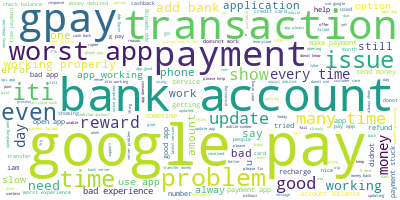

In [60]:
# Import the wordcloud library
from wordcloud import WordCloud
# Join the different processed titles together.
long_string = ','.join(list(gp_df['remove_stop'].values))
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(long_string)
# Visualize the word cloud
wordcloud.to_image()

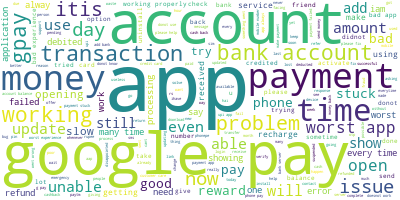

In [61]:
#negative score wordcloud
# Import the wordcloud library
from wordcloud import WordCloud
# Join the different processed titles together.
long_string = ','.join(list(gp_df['remove_stop'].values))
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=9, contour_color='black')
# Generate a word cloud
wordcloud.generate(" ".join(df[gp_df.score == 1].content))
# Visualize the word cloud
wordcloud.to_image()

# Latent Dirichlet Allocation

#### LDA assumes that documents are composed of words that help determine the topics and maps documents to a list of topics by 

#### assigning each word in the document to different topics. 

\begin{gather*}
p(word  with topic  ) = p(topic  | document ) * p(word  | topic )\\
\end{gather*}

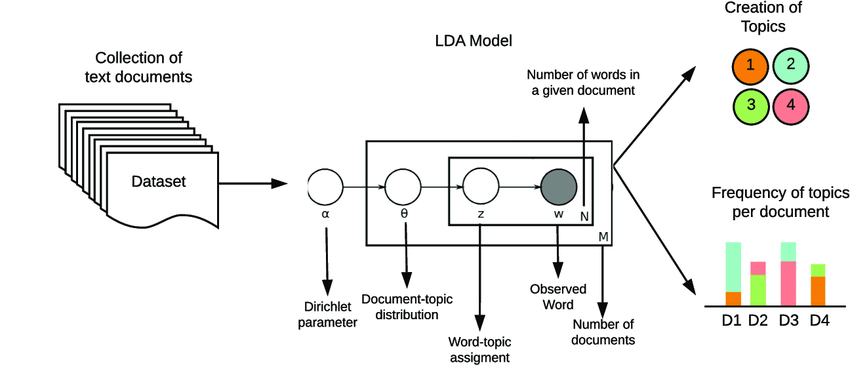

In [62]:
import gensim
from gensim import corpora

In [65]:
#https://medium.com/analytics-vidhya/play-store-app-reviews-textual-data-topic-modelling-using-lda-f24bdbd2910d
cv = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
gpy= cv.fit_transform(gp_df['remove_stop'])
gpy

<42084x7432 sparse matrix of type '<class 'numpy.int64'>'
	with 341955 stored elements in Compressed Sparse Row format>

In [66]:
LDA = LatentDirichletAllocation(n_components=5,random_state=1)
LDA.fit(gpy)

LatentDirichletAllocation(n_components=5, random_state=1)

In [67]:
for index,topic in enumerate(LDA.components_):
    print(f'topic #{index} : ')
    print([cv.get_feature_names()[i] for i in topic.argsort()[-30:]])
    

topic #0 : 
['mera', 'adding', 'connect', 'mobile', 'help', 'linked', 'payment', 'bad', 'problem', 'raha', 'able', 'bhi', 'sms', 'suspended', 'se', 'hi', 'unable', 'link', 'number', 'nahi', 'nhi', 'activate', 'ho', 'app', 'google', 'pay', 'hai', 'add', 'bank', 'account']
topic #1 : 


C:\Users\admin\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



['help', 'uninstall', 'new', 'best', 'using', 'doesnot', 'updating', 'work', 'application', 'days', 'latest', 'updated', 'unable', 'screen', 'able', 'version', 'gpay', 'use', 'time', 'slow', 'itis', 'phone', 'opening', 'working', 'update', 'google', 'open', 'pay', 'good', 'app']
topic #2 : 
['id', 'using', 'useless', 'gpay', 'apps', 'phone', 'donot', 'transaction', 'number', 'code', 'need', 'credit', 'cards', 'like', 'itis', 'rewards', 'add', 'make', 'transactions', 'payments', 'doesnot', 'option', 'work', 'upi', 'pay', 'google', 'payment', 'use', 'app', 'card']
topic #3 : 
['mobile', 'transaction', 'days', 'fix', 'tried', 'facing', 'wrong', 'issues', 'unable', 'iam', 'try', 'able', 'payment', 'shows', 'times', 'properly', 'itis', 'showing', 'error', 'check', 'gpay', 'account', 'server', 'issue', 'bank', 'problem', 'time', 'balance', 'app', 'working']
topic #4 : 
['received', 'reward', 'itis', 'didnot', 'deducted', 'send', 'refund', 'gpay', 'times', 'got', 'transfer', 'service', 'exper

In [68]:
topic_results = LDA.transform(gpy)
df_topic_results = pd.DataFrame(topic_results, columns=[
'0_InternetCharges',
'1_Payment/Offers' ,
'2_App'            ,
'3_Booking-Refund/Ticket'  ,
'4_Booking-Location/language' 
])
df_result = pd.merge(gp_df, df_topic_results,  how='inner', left_index=True, right_index=True )
df_output = pd.merge(df, df_result,  how='left', on=[ 'reviewId','content' ])
df_output.head()

  

,Unnamed: 0_x,reviewId,userName_x,userImage_x,content,score_x,thumbsUpCount_x,reviewCreatedVersion_x,at_x,replyContent_x,...,lemmatized,Bi_gram,Tri_gram,word_count,char_count,0_InternetCharges,1_Payment/Offers,2_App,3_Booking-Refund/Ticket,4_Booking-Location/language
0,2,98e3d388-6333-40e9-885f-92a15c8e9140,navy navy,https://play-lh.googleusercontent.com/a-/ACNPE...,not fast open,2,0,166.1.5 (armeabi-v7a_release_flutter),2022-11-24 10:56:28,Sorry about that. Please ensure that you're us...,...,"[fast, open]","[[fast, open]]",[],3,13,0.066689,0.732494,0.066672,0.067048,0.067098
1,4,8283da75-2962-4009-a075-ca1b6c31e3cb,renuka bagalkot,https://play-lh.googleusercontent.com/a-/ACNPE...,recently i referred to so many friends but i w...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:50:49,Hi Renuka. We'll surely get you that reward. F...,...,"[recently, referred, many, friend, getting, re...","[[recently, referred], [referred, many], [many...","[[recently, referred, many], [referred, many, ...",18,94,0.025030,0.025586,0.025970,0.026305,0.897108
2,13,91b27825-8431-448b-bd9d-87b9ed32a0ac,Suraj Patel,https://play-lh.googleusercontent.com/a-/ACNPE...,payment issue,2,0,136.1.5 (arm64-v8a_release_flutter),2022-11-24 10:38:56,"Uh-oh. We're sorry, Suraj. Please check if you...",...,"[payment, issue]","[[payment, issue]]",[],2,13,0.066932,0.067097,0.067278,0.412781,0.385912
3,18,19b11931-d761-4910-b4e1-859db1b0f244,Aswin kumar,https://play-lh.googleusercontent.com/a-/ACNPE...,app opening issue,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 10:19:55,Hi Aswin. Please ensure that you're using the ...,...,"[app, opening, issue]","[[app, opening], [opening, issue]]","[[app, opening, issue]]",3,17,0.050087,0.796183,0.050098,0.053031,0.050601
4,24,173c9bf1-d591-4251-8846-14a6d22ad83d,Prabin kumar bhoi,https://play-lh.googleusercontent.com/a-/ACNPE...,it is very slow and app is not opening now.ver...,1,0,166.1.5 (arm64-v8a_release_flutter),2022-11-24 09:59:01,"Sorry about that, Prabin. Please ensure that y...",...,"[slow, app, opening, nowvery, bad, experience]","[[slow, app], [app, opening], [opening, nowver...","[[slow, app, opening], [app, opening, nowvery]...",12,63,0.028871,0.883636,0.028760,0.028981,0.029753


## CONCLUSION

#### <span style='color:green'> The output from the model are 5 topics each containing list of top 30 words.  </span>
#### The function argsort() helps us to get index positions of high frequency words under a particular topic. 
#### Naming to each topic is given after interpreting the words within each topic. 
#### <span style='color:red'> Slow, Error, Refund, Failed, Stuck are some of the most commonly faced issues in Google Pay</span>
#### For more accuracy report, data will be further preprocessed 
